Contents:
1. Feature sets testing:
    * [Read Text GeMAPS](#read_ge)
    * [Spontaneus Dialogue GeMAPS](#spont_ge)
    * [Read Text eGeMAPS](#read_ege)
    * [Spontaneus Dialogue eGeMAPS](#spont_ege)
    * [Best Value Summary](#summary)
1. Architecture testing:
    * ID1: [in > x > out](#id1)
    * ID2: [in > x > x > out](#id2)
    * ID3: [in > x > x/2 > out](#id3)
    * ID4: [in > x > x > x > out](#id4)
    * ID5: [in > x > x > x/2 > out](#id5)
    * ID6: [in > x > x/2 > x/2 > out](#id6)
    * ID7: [in > x > x/2 > x/4 > out](#id7)
    * [Best Value Mean Summary](#best_mean)
    * [Best Value Max Summary](#best_max)

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [19]:
def visualize_cycles(directory,name, cycle_num=5, sup_title = ''):
    """
    Function to draw plots for each of training cycle csv
    Parameters:
    directory - path to the csv files
    name - name shared between the files (without the number)
    cycle_num - how many training cycles were there
    """
    plt.figure(figsize=(15,7*cycle_num))
    for i in range(1,cycle_num+1):
        df = pd.read_csv(directory+name+str(i)+'.csv', index_col=0)
        ax = plt.subplot(cycle_num,2,i*2-1)
        plt.plot(df['loss'], label = 'Loss')
        plt.plot(df['val_loss'], label = 'Val Loss')
        ax.set_title("Loss Cycle " + str(i))
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        handles, labels = ax.get_legend_handles_labels()
        ax.legend(handles, labels)
        ax = plt.subplot(cycle_num,2,i*2)
        plt.plot(df['accuracy'], label= 'Accuracy')
        plt.plot(df['val_accuracy'], label = 'Val Accuracy')
        ax.set_title("Accuracy Cycle " + str(i))
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        handles, labels = ax.get_legend_handles_labels()
        ax.legend(handles, labels)
        if sup_title!='':
            plt.suptitle(sup_title, fontsize =24, y = 0.9)

<a id='read_ge'></a>

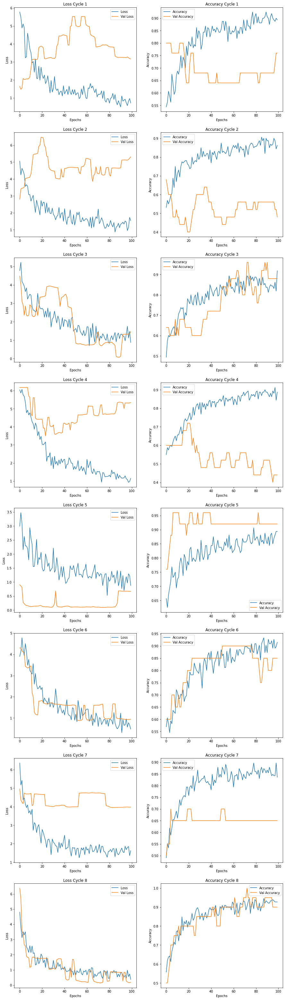

In [20]:
visualize_cycles('./train_outputs/ReadText_GeMAPSv01b/', 'Metrics_training', cycle_num=8)

In [21]:
df1 = pd.read_csv('./train_outputs/ReadText_GeMAPSv01b/Metrics_best.csv', index_col=0)
df1

,Best_Loss,Best_Acc,Best_Loss_Val,Best_Acc_Val
Model_Num,,,,
0,5.775314,0.925000,5.524868,0.80
1,5.057004,0.906250,6.472403,0.68
2,5.223654,0.918750,4.480286,0.96
3,6.063623,0.912500,6.169979,0.72
4,3.476613,0.906250,0.902368,0.96
5,4.779590,0.933333,4.299142,0.90
6,6.357842,0.896970,4.959118,0.70
7,4.798047,0.945455,6.378580,1.00


<a id='spont_ge'></a>

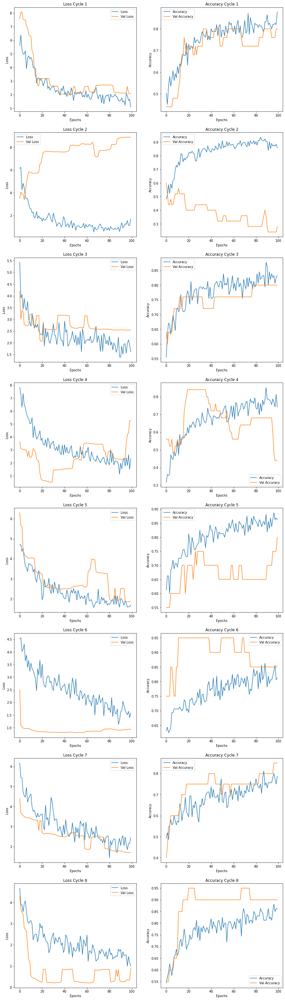

In [22]:
visualize_cycles('./train_outputs/SpontaneousDialogue_GeMAPSv01b/', 'Metrics_training', cycle_num=8)

In [23]:
df2 = pd.read_csv('./train_outputs/SpontaneousDialogue_GeMAPSv01b/Metrics_best.csv', index_col=0)
df2

,Best_Loss,Best_Acc,Best_Loss_Val,Best_Acc_Val
Model_Num,,,,
0,6.384249,0.877419,8.073764,0.80
1,6.235600,0.935484,8.893014,0.60
2,5.426958,0.877419,4.186079,0.80
3,7.817844,0.851613,5.252486,0.84
4,4.701455,0.887500,6.297748,0.80
5,4.555848,0.862500,2.487859,0.95
6,6.170446,0.812500,4.410821,0.85
7,4.671865,0.881250,4.300988,0.95


<a id='read_ege'></a>

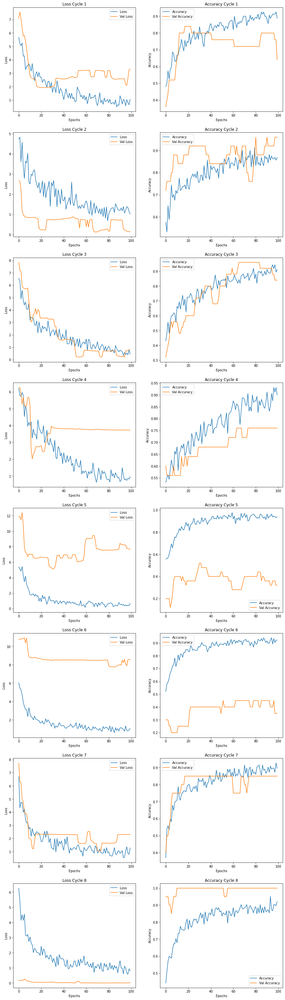

In [24]:
visualize_cycles('./train_outputs/ReadText_eGeMAPSv01b/', 'Metrics_training', cycle_num=8)

In [25]:
df3 = pd.read_csv('./train_outputs/ReadText_eGeMAPSv01b/Metrics_best.csv', index_col=0)
df3

,Best_Loss,Best_Acc,Best_Loss_Val,Best_Acc_Val
Model_Num,,,,
0,5.678156,0.925000,7.559632,0.84
1,4.826810,0.912500,2.680478,0.96
2,6.558124,0.943750,7.850758,0.96
3,6.191612,0.931250,6.256474,0.76
4,5.421981,0.975000,12.399395,0.52
5,6.037763,0.939394,10.933393,0.45
6,6.709394,0.927273,7.745607,0.85
7,6.269877,0.951515,0.261109,1.00


<a id='spont_ege'></a>

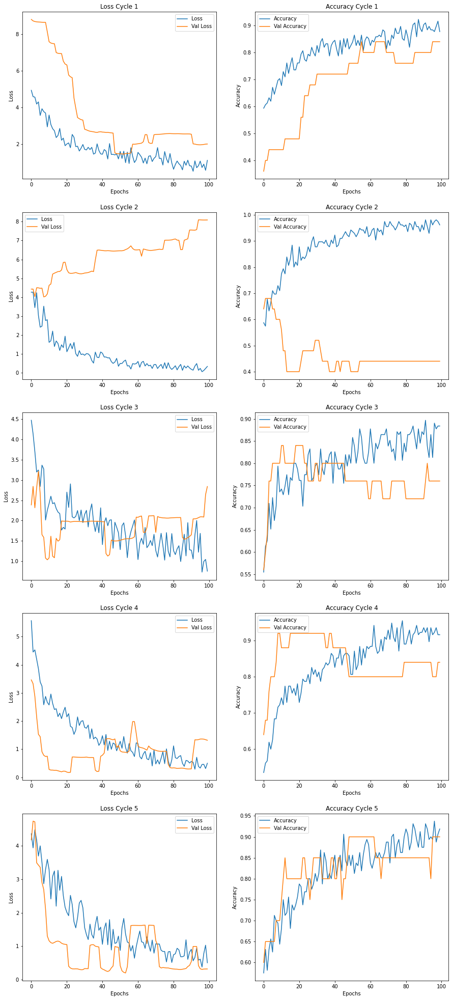

In [26]:
visualize_cycles('./train_outputs/SpontaneousDialogue_eGeMAPSv01b/', 'Metrics_training')

In [27]:
df4 = pd.read_csv('./train_outputs/SpontaneousDialogue_eGeMAPSv01b/Metrics_best.csv', index_col=0)
df4

,Best_Loss,Best_Acc,Best_Loss_Val,Best_Acc_Val
Model_Num,,,,
0,4.935141,0.922581,8.794699,0.84
1,4.269743,0.980645,8.097300,0.68
2,4.470824,0.896774,3.213861,0.84
3,5.566602,0.954839,3.462871,0.92
4,4.475883,0.937500,4.735867,0.90
5,5.180791,0.900000,7.675033,0.65
6,4.028248,0.918750,0.844431,1.00
7,5.469812,0.912500,4.662446,0.75


<a id='summary'></a>

In [28]:
acc1 = df1[['Best_Acc','Best_Acc_Val']].max()
acc2 = df2[['Best_Acc','Best_Acc_Val']].max()
acc3 = df3[['Best_Acc','Best_Acc_Val']].max()
acc4 = df4[['Best_Acc','Best_Acc_Val']].max()
print('Accuracy table:')
df = pd.DataFrame([acc1,acc2,acc3,acc4], index=['Read GeMAPS', 'Spontaneus GeMAPS','Read eGeMAPS', 'Spontaneus eGeMAPS'])
df.style.highlight_max(color = 'lightgreen', axis = 0)

Accuracy table:


,Best_Acc,Best_Acc_Val
Read GeMAPS,0.945455,1.000000
Spontaneus GeMAPS,0.935484,0.950000
Read eGeMAPS,0.975000,1.000000
Spontaneus eGeMAPS,0.980645,1.000000


In [29]:
loss1 = df1[['Best_Loss','Best_Loss_Val']].min()
loss2 = df2[['Best_Loss','Best_Loss_Val']].min()
loss3 = df3[['Best_Loss','Best_Loss_Val']].min()
loss4 = df4[['Best_Loss','Best_Loss_Val']].min()
print('Loss table')
df = pd.DataFrame([loss1,loss2,loss3,loss4], index=['Read GeMAPS', 'Spontaneus GeMAPS','Read eGeMAPS', 'Spontaneus eGeMAPS'])
df.style.highlight_min(color = 'lightgreen', axis = 0)

Loss table


,Best_Loss,Best_Loss_Val
Read GeMAPS,3.476613,0.902368
Spontaneus GeMAPS,4.555848,2.487859
Read eGeMAPS,4.826810,0.261109
Spontaneus eGeMAPS,4.028248,0.844431


<a id='id1'></a>

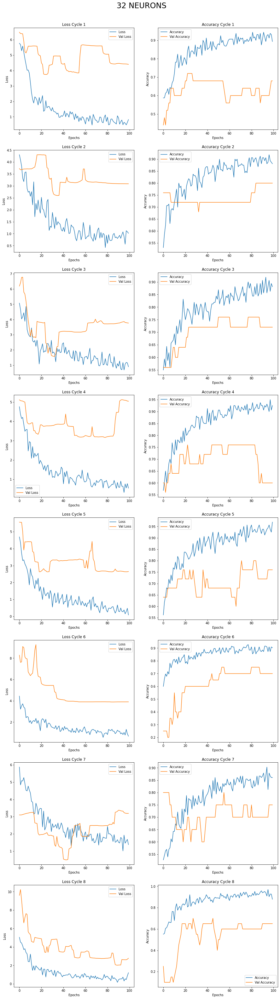

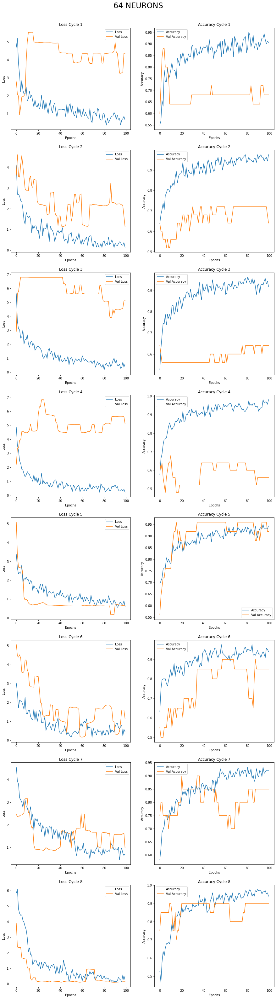

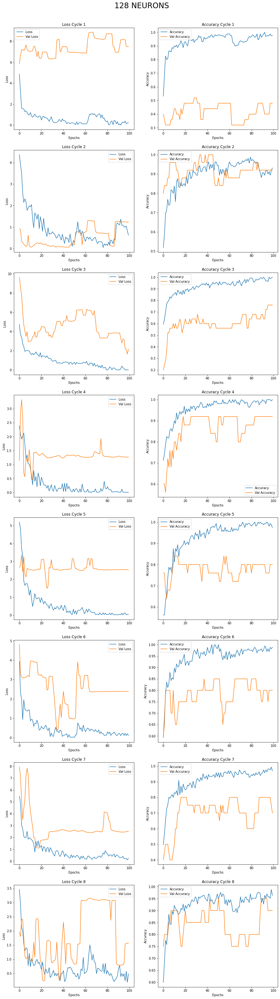

In [30]:
for i in [32, 64, 128]:
    visualize_cycles('./layer_test_train_outputs/id1/'+str(i)+'/', 'Id1_training', cycle_num=8, sup_title=str(i)+' NEURONS')

<a id='id2'></a>

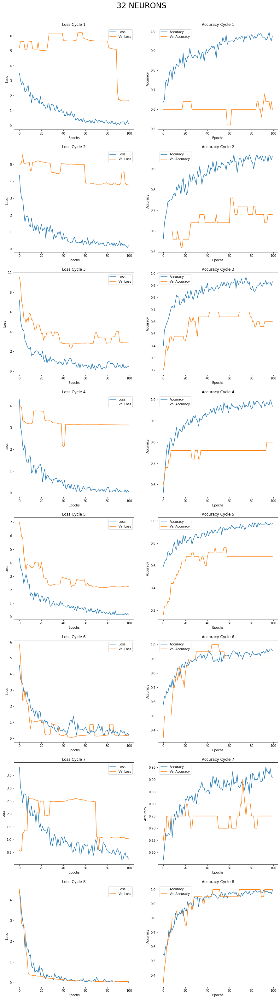

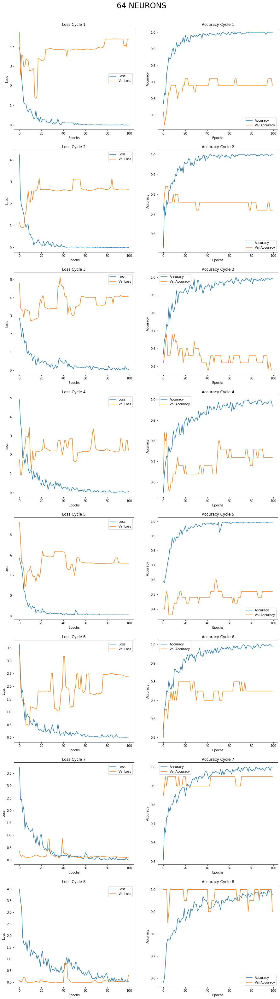

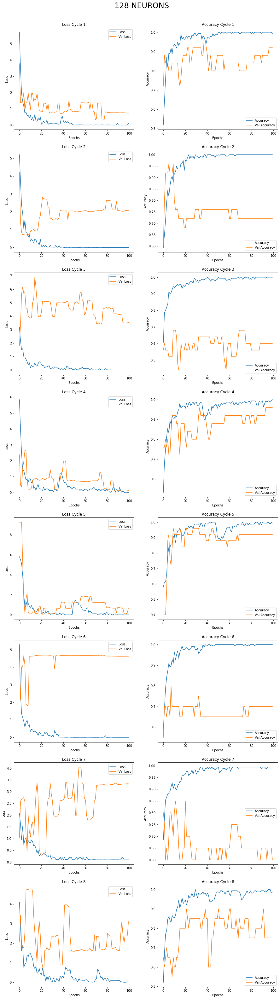

In [31]:
for i in [32, 64, 128]:
    visualize_cycles('./layer_test_train_outputs/id2/'+str(i)+'/', 'Id1_training', cycle_num=8, sup_title=str(i)+' NEURONS')

<a id='id3'></a>

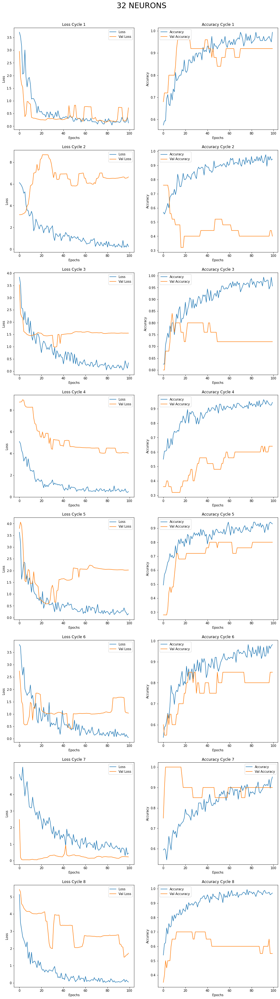

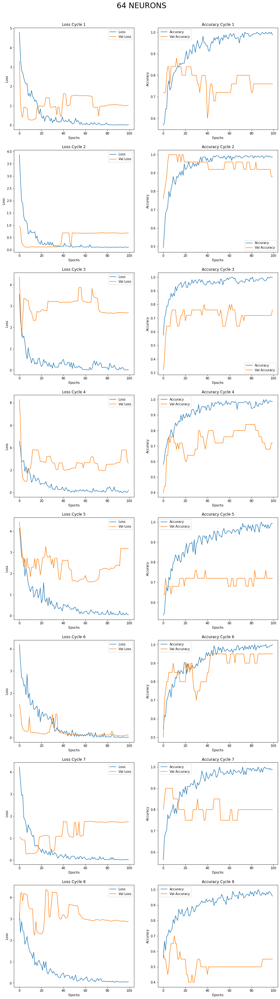

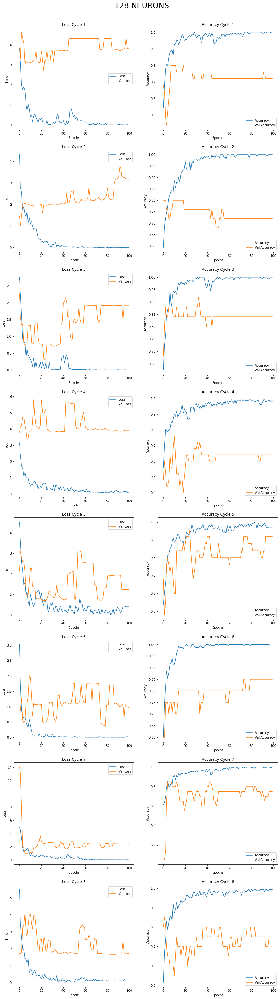

In [32]:
for i in [32, 64, 128]:
    visualize_cycles('./layer_test_train_outputs/id3/'+str(i)+'/', 'Id1_training', cycle_num=8, sup_title=str(i)+' NEURONS')

<a id='id4'></a>

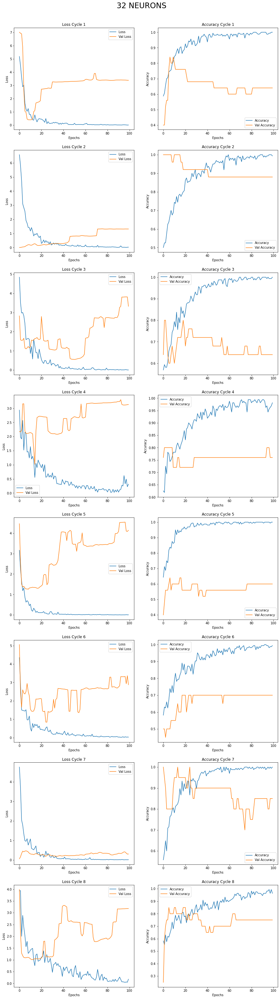

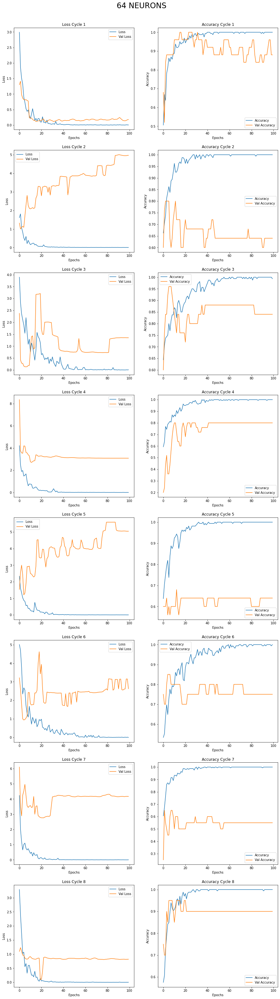

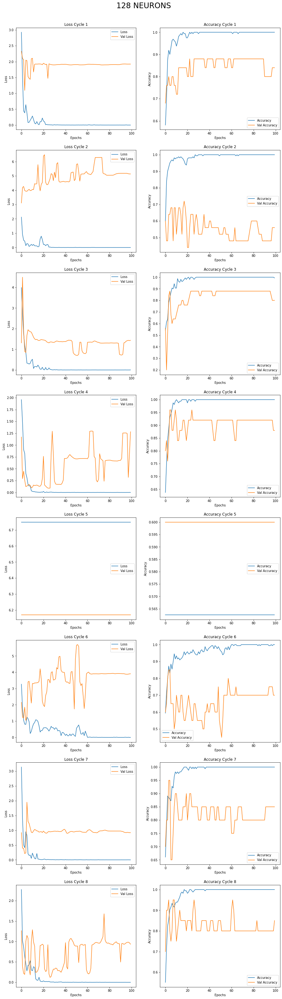

In [33]:
for i in [32, 64, 128]:
    visualize_cycles('./layer_test_train_outputs/id4/'+str(i)+'/', 'Id1_training', cycle_num=8, sup_title=str(i)+' NEURONS')

<a id='id5'></a>

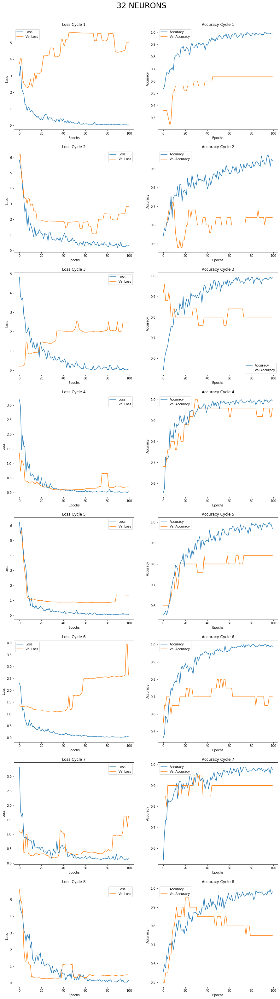

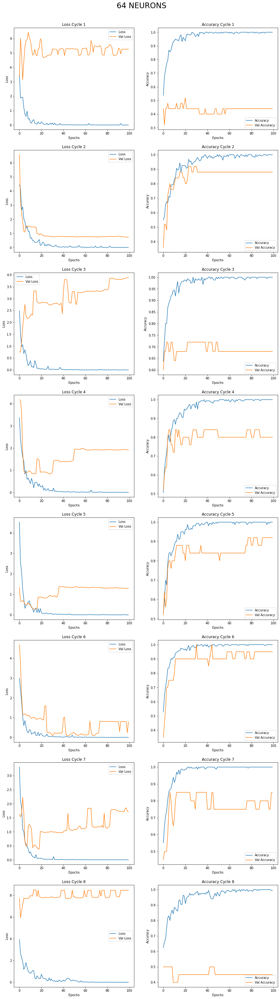

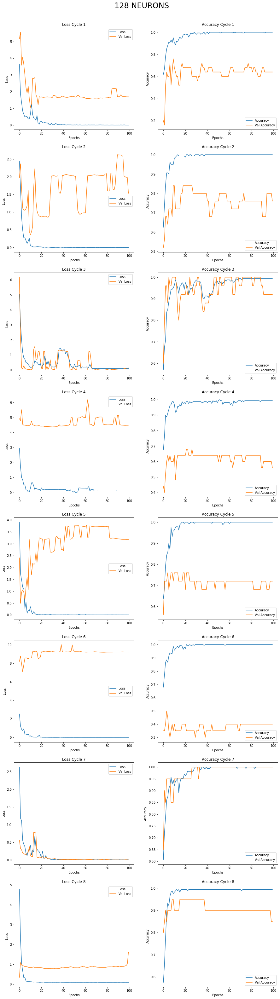

In [34]:
for i in [32, 64, 128]:
    visualize_cycles('./layer_test_train_outputs/id5/'+str(i)+'/', 'Id1_training', cycle_num=8, sup_title=str(i)+' NEURONS')

<a id='id6'></a>

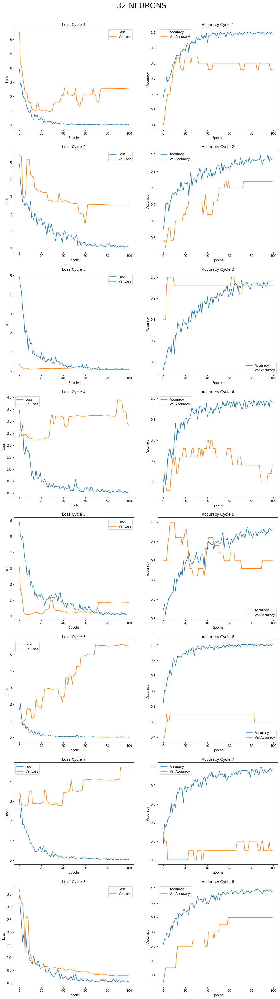

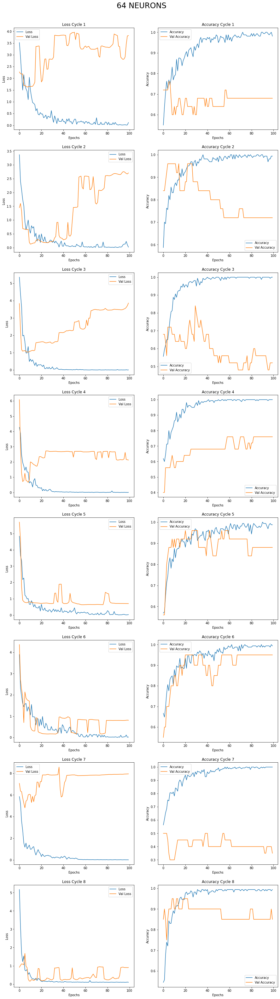

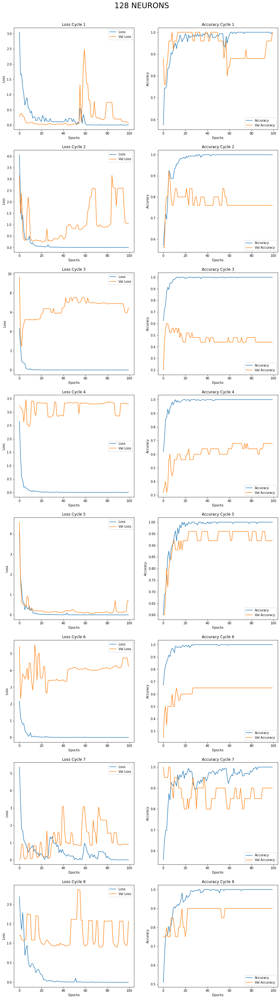

In [35]:
for i in [32, 64, 128]:
    visualize_cycles('./layer_test_train_outputs/id6/'+str(i)+'/', 'Id1_training', cycle_num=8, sup_title=str(i)+' NEURONS')

<a id='id7'></a>

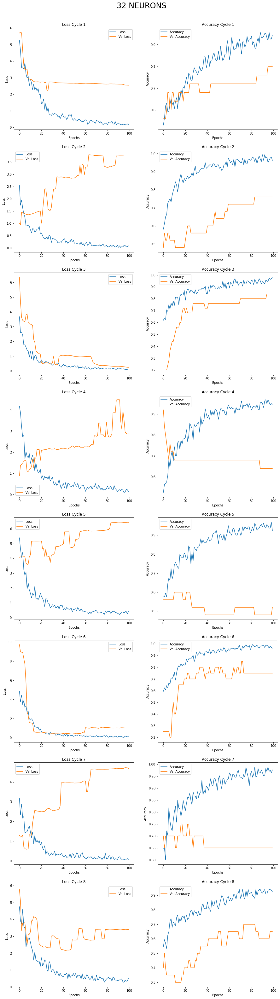

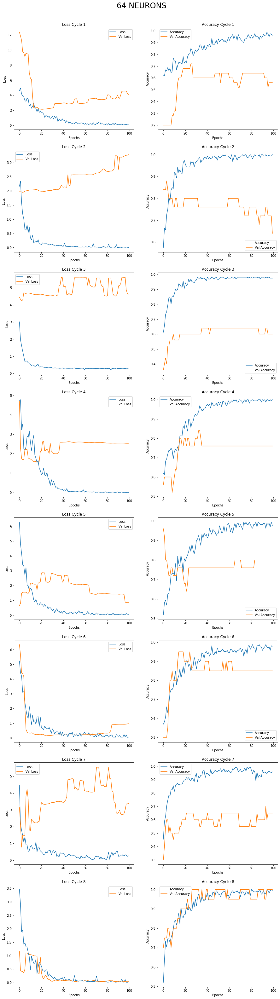

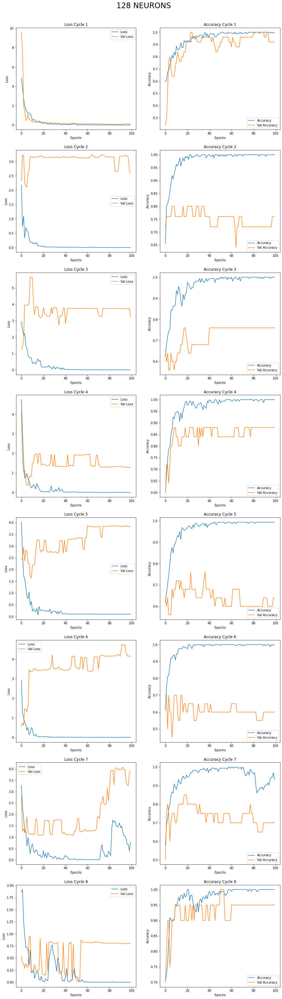

In [36]:
for i in [32, 64, 128]:
    visualize_cycles('./layer_test_train_outputs/id7/'+str(i)+'/', 'Id1_training', cycle_num=8, sup_title=str(i)+' NEURONS')

<a id='best_mean'></a>

In [48]:
df_best_arch = pd.DataFrame() # DataFrame to store mean values of best results from each architecture
for i in [1,2,3,4,5,6,7]:
    for x in [32,64,128]:
        df_temp = pd.read_csv('./layer_test_train_outputs/id'+str(i)+'/'+str(x)+'/Id1_best.csv', index_col=0)
        df_best_arch['id'+str(i)+'_'+str(x)] = df_temp.mean()
        
df_best_arch = df_best_arch.transpose()
df_best_arch

,Best_Loss,Best_Acc,Best_Loss_Val,Best_Acc_Val
id1_32,4.994621,0.937500,6.391781,0.76125
id1_64,4.590985,0.962950,5.118885,0.82250
id1_128,4.301104,0.996165,5.296461,0.83000
id2_32,4.564504,0.979238,5.667269,0.82250
id2_64,4.128680,0.999219,3.851121,0.80375
id2_128,4.650503,0.999242,5.052283,0.88375
id3_32,4.622516,0.974503,4.854089,0.81875
id3_64,4.074593,0.999219,3.619905,0.85375
id3_128,4.001385,0.998461,4.959944,0.84875
id4_32,4.468320,0.998461,3.687512,0.82875


In [49]:
df = df_best_arch[['Best_Acc', 'Best_Acc_Val']]
df.style.highlight_max(color = 'lightgreen', axis = 0)

,Best_Acc,Best_Acc_Val
id1_32,0.937500,0.761250
id1_64,0.962950,0.822500
id1_128,0.996165,0.830000
id2_32,0.979238,0.822500
id2_64,0.999219,0.803750
id2_128,0.999242,0.883750
id3_32,0.974503,0.818750
id3_64,0.999219,0.853750
id3_128,0.998461,0.848750
id4_32,0.998461,0.828750


In [51]:
df = df_best_arch[['Best_Loss', 'Best_Loss_Val']]
df.style.highlight_min(color = 'lightgreen', axis = 0)

,Best_Loss,Best_Loss_Val
id1_32,4.994621,6.391781
id1_64,4.590985,5.118885
id1_128,4.301104,5.296461
id2_32,4.564504,5.667269
id2_64,4.128680,3.851121
id2_128,4.650503,5.052283
id3_32,4.622516,4.854089
id3_64,4.074593,3.619905
id3_128,4.001385,4.959944
id4_32,4.468320,3.687512


<a id='best_max'></a>

In [54]:
df_best_arch = pd.DataFrame() # DataFrame to store max values of best results from each architecture
for i in [1,2,3,4,5,6,7]:
    for x in [32,64,128]:
        df_temp = pd.read_csv('./layer_test_train_outputs/id'+str(i)+'/'+str(x)+'/Id1_best.csv', index_col=0)
        df_best_arch['id'+str(i)+'_'+str(x)] = df_temp.max()
        
df_best_arch = df_best_arch.transpose()
df_best_arch

,Best_Loss,Best_Acc,Best_Loss_Val,Best_Acc_Val
id1_32,5.875974,0.969697,10.228746,0.80
id1_64,6.064112,0.981250,6.822856,0.96
id1_128,5.465438,1.000000,9.635502,1.00
id2_32,7.233947,1.000000,9.535555,1.00
id2_64,5.700731,1.000000,9.254970,1.00
id2_128,5.841383,1.000000,9.263213,0.96
id3_32,6.115278,0.993939,8.965355,1.00
id3_64,4.796267,1.000000,8.278481,1.00
id3_128,5.496797,1.000000,14.031827,0.96
id4_32,6.580620,1.000000,7.020942,1.00


In [55]:
df = df_best_arch[['Best_Acc', 'Best_Acc_Val']]
df.style.highlight_max(color = 'lightgreen', axis = 0)

,Best_Acc,Best_Acc_Val
id1_32,0.969697,0.800000
id1_64,0.981250,0.960000
id1_128,1.000000,1.000000
id2_32,1.000000,1.000000
id2_64,1.000000,1.000000
id2_128,1.000000,0.960000
id3_32,0.993939,1.000000
id3_64,1.000000,1.000000
id3_128,1.000000,0.960000
id4_32,1.000000,1.000000


In [59]:
df_best_arch = pd.DataFrame() # DataFrame to store max values of best results from each architecture
for i in [1,2,3,4,5,6,7]:
    for x in [32,64,128]:
        df_temp = pd.read_csv('./layer_test_train_outputs/id'+str(i)+'/'+str(x)+'/Id1_best.csv', index_col=0)
        df_best_arch['id'+str(i)+'_'+str(x)] = df_temp.min()
df_best_arch = df_best_arch.transpose()       
df = df_best_arch[['Best_Loss', 'Best_Loss_Val']]
df.style.highlight_min(color = 'lightgreen', axis = 0)

,Best_Loss,Best_Loss_Val
id1_32,4.306179,3.374153
id1_64,3.019991,3.178765
id1_128,2.379074,1.303339
id2_32,3.506432,2.605676
id2_64,2.876595,0.829875
id2_128,2.071939,2.637903
id3_32,3.629699,2.484321
id3_64,3.249927,0.962148
id3_128,2.756293,1.992772
id4_32,2.936968,0.463340
